In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES']='0'

from fastai import *
from fastai.vision import *
from superRes.generators import *
from superRes.critics import *
from superRes.dataset import *
from superRes.loss import *
from superRes.save import *
from superRes.fid_loss import *
from superRes.ssim import *
from superRes.metrics import *


import torchvision
import geffnet # efficient/ mobile net

In [2]:
def do_fit(learn, epochs,save_name, lrs=slice(1e-3), pct_start=0.9):
    learn.fit_one_cycle(epochs, lrs, pct_start=pct_start)
    learn.save(save_name)
    learn.show_results(rows=1, imgsize=20)

In [3]:
path = Path('./dataset/')

path_fullRes = path/'DIV2K_train_HR'
path_lowRes_diff = path/'DIV2K_train_LR_difficult' # suffix "x4d" ~300px
path_lowRes_mild = path/'DIV2K_train_LR_mild' # suffix "x4m" ~300px
path_lowRes_x8 = path/'DIV2K_train_LR_x8' # suffix "x8" ~150px

path_lowRes_128 = path/'DIV2K_train_LR_128'
path_lowRes_256 = path/'DIV2K_train_LR_256'
path_lowRes_512 = path/'DIV2K_train_LR_512'
path_lowRes_Full = path/'DIV2K_train_LR_Full'

proj_id = 'unet_superRes_mobilenetV3_FID'

gen_name = proj_id + '_gen'
crit_name = proj_id + '_crit'

nf_factor = 2
pct_start = 1e-8

In [5]:
model = geffnet.mobilenetv3_rw

In [6]:
# loss_func = FeatureLoss()
# loss_func = msssim
loss_func = fid

# 256px

In [8]:
bs=10
sz=256
lr = 1e-2
wd = 1e-3
epochs = 1

In [9]:
data_gen = get_DIV2k_data_QF(path_lowRes_256, path_fullRes, bs=bs, sz=sz)

In [9]:
learn_gen = gen_learner_wide(data=data_gen,
                             gen_loss=loss_func,
                             arch = model,
                             nf_factor=nf_factor)

In [11]:
learn_gen.load("/data/students_home/fmameli/repos/SuperRes/dataset/DIV2K_train_LR_Patches/64px/models/unet_superRes_mobilenetV3_Patches64px_gen_512px_0")

Learner(data=ImageDataBunch;

Train: LabelList (800 items)
x: ImageImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: ImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
Path: dataset/DIV2K_train_LR_256;

Valid: LabelList (100 items)
x: ImageImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: ImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
Path: dataset/DIV2K_train_LR_256;

Test: None, model=DynamicUnetWide(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(16, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (2): HardSwish()
      (3): Sequential(
        (0): Sequential(
          (0): DepthwiseSeparableConv(
           

In [18]:
learn_gen.metrics.append(SSIM_Metric())
learn_gen.metrics.append(LPIPS_Metric())
learn_gen.metrics.append(BRISQUE_Metric())
learn_gen.metrics.append(NIQE_Metric())

Setting up Perceptual loss...
Loading model from: /data/students_home/fmameli/anaconda3/envs/fastai/lib/python3.6/site-packages/perceptual_similarity/weights/v0.1/alex.pth
...[net-lin [alex]] initialized
...Done


In [13]:
wandbCallbacks = False

if wandbCallbacks:
    import wandb
    from wandb.fastai import WandbCallback
    config={"batch_size": bs,
            "img_size": (sz, sz),
            "learning_rate": lr,
            "weight_decay": wd,
            "num_epochs": epochs
    }
    wandb.init(project='SuperRes', config=config, id="unet_superRes_mobilenetV3_FID"+ datetime.now().strftime('_%m-%d_%H:%M'))

    learn_gen.callback_fns.append(partial(WandbCallback, input_type='images'))

In [14]:
# learn_gen.lr_find()
# learn_gen.recorder.plot()
# learn_gen.summary()

epoch,train_loss,valid_loss,ssim,lpips,brisque,niqe,time
0,0.161844,0.102632,0.239920,0.088240,79.154767,21.635550,15:36


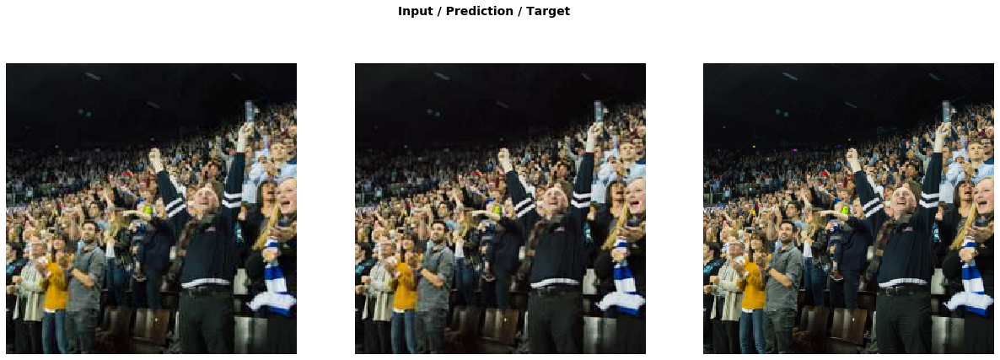

In [16]:
do_fit(learn_gen, epochs, gen_name+"_256px_0", slice(lr*10))

In [17]:
learn_gen.unfreeze()

epoch,train_loss,valid_loss,ssim,lpips,brisque,niqe,time
0,0.156768,0.102083,0.238628,0.088092,78.728476,21.948536,15:16
1,0.157379,0.102125,0.234876,0.086038,79.201639,21.981016,15:06
2,0.157957,0.098839,0.228067,0.084533,79.094438,21.914152,15:04


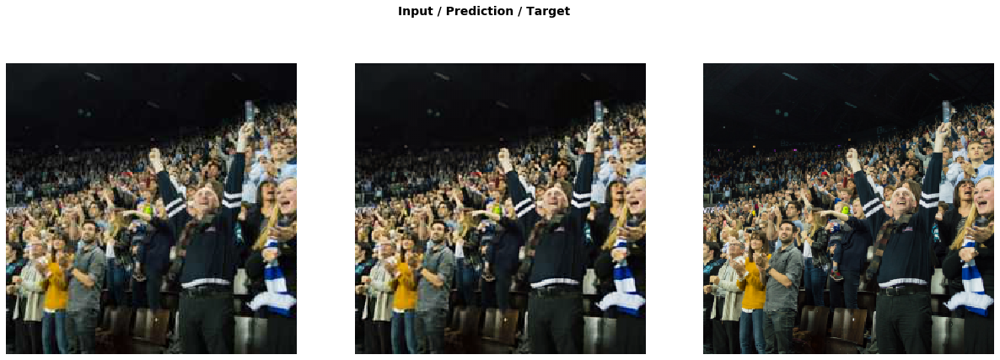

In [18]:
do_fit(learn_gen, 3, gen_name+"_256px_0", lr)

# 512px

In [7]:
bs=4
sz=512
epochs = 1

In [8]:
data_gen = get_DIV2k_data_QF(path_lowRes_512, path_fullRes, bs=bs, sz=sz)

In [10]:
learn_gen.data = data_gen
learn_gen.freeze()
gc.collect()

7

In [ ]:
learn_gen.load(gen_name+"_256px_0")

In [ ]:
learn_gen.lr_find()
learn_gen.recorder.plot()

Upsize to gen_512


epoch,train_loss,valid_loss,ssim,lpips,brisque,niqe,time
0,0.088534,0.055169,0.207096,0.090257,86.606160,17.170969,41:31
1,0.090742,0.054928,0.206606,0.089873,86.678657,17.219793,41:01
2,0.087534,0.053781,0.205868,0.089037,86.880729,17.244396,40:46


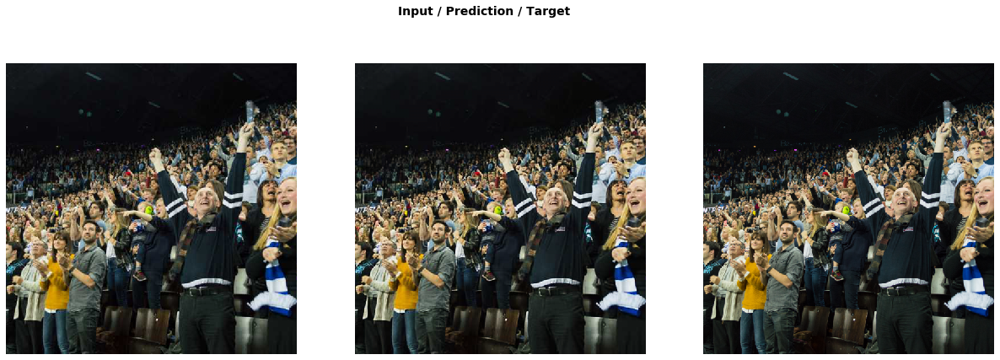

In [22]:
print("Upsize to gen_512")

do_fit(learn_gen, 3, gen_name+"_512px_0", 1e-3)

In [13]:
learn_gen.load("/data/students_home/fmameli/repos/SuperRes/dataset/DIV2K_train_LR_256/models/"+gen_name+"_512px_0")

Learner(data=ImageDataBunch;

Train: LabelList (800 items)
x: ImageImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
y: ImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
Path: dataset/DIV2K_train_LR_512;

Valid: LabelList (100 items)
x: ImageImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
y: ImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
Path: dataset/DIV2K_train_LR_512;

Test: None, model=DynamicUnetWide(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(16, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (2): HardSwish()
      (3): Sequential(
        (0): Sequential(
          (0): DepthwiseSeparableConv(
           

In [14]:
learn_gen.unfreeze()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


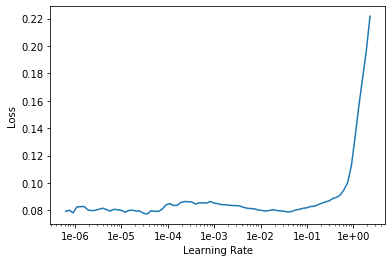

In [24]:
learn_gen.lr_find()
learn_gen.recorder.plot()

epoch,train_loss,valid_loss,ssim,lpips,brisque,niqe,ssim,lpips,brisque,niqe,time
0,0.088339,0.054084,0.205908,0.089149,86.789834,17.242689,0.205908,0.089149,86.789834,17.242689,41:21


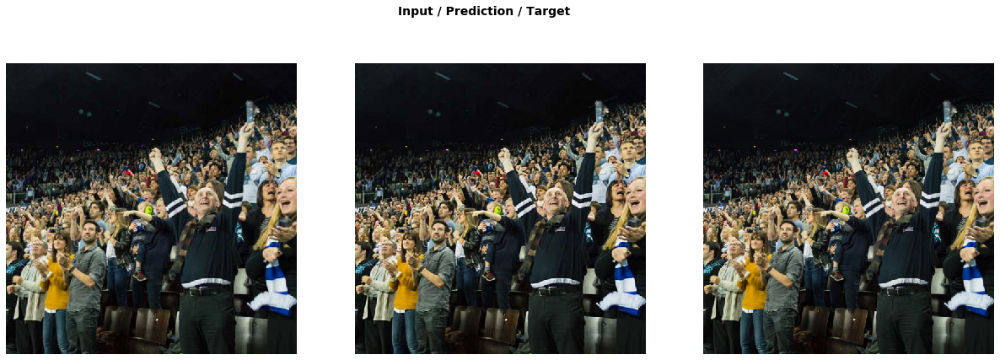

In [19]:
do_fit(learn_gen, 1, gen_name+"_512px_1", 1e-4)

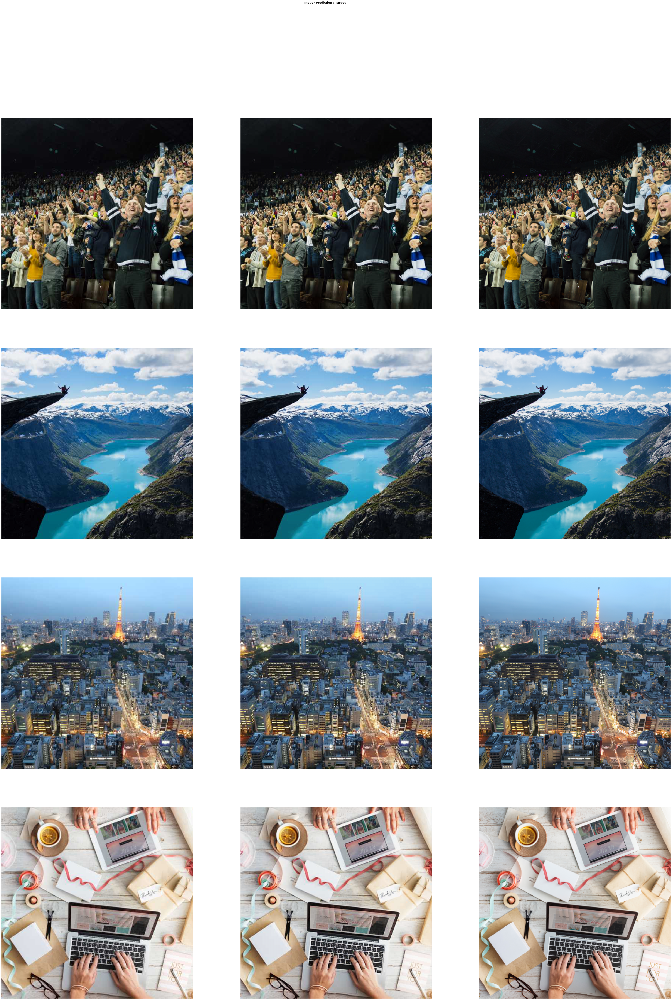

In [20]:
learn_gen.show_results(rows=10, imgsize=20)

In [ ]:
learn_gen = None
gc.collect()